In [1]:
%matplotlib inline
import os, sys
import time
import json
sys.path.insert(0, '/usr/local/opencv-2.4.13/lib/python2.7/site-packages/')
import cv2
print cv2.__version__

import numpy as np
from skimage import io, transform
from skimage.draw import polygon, polygon_perimeter

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (20.0, 7.0)


2.4.13


In [57]:
def show_polygons(im, polygons):
    assert polygons.shape[1] == 8
    for p in polygons:
        rr, cc = polygon(p[1::2], p[0::2])
        rr = np.clip(rr, 0, im.shape[0]-1)
        cc = np.clip(cc, 0, im.shape[1]-1)
        alpha = 0.5 # set alpha of marker
        im[rr, cc, 0] = alpha * 255 + im[rr, cc, 0] * (1 - alpha)
        im[rr, cc, 1] = im[rr, cc, 1] * (1 - alpha)
        im[rr, cc, 2] = im[rr, cc, 2] * (1 - alpha)
        im[p[1]-1:p[1]+2, p[0]-1:p[0]+2] = np.array([0,255,0], dtype=np.uint8) # green for start point
        im[p[3]-1:p[3]+2, p[2]-1:p[2]+2] = np.array([0,0,255], dtype=np.uint8) # blue for end point
    plt.imshow(im);plt.show()

# COCO-Text

In [2]:

image_root = '/world/data-c7/censhusheng/data/COCO/images/train2014/'
anno_file = '/world/data-c7/censhusheng/data/COCO-Text/COCO_Text.json'


with open(anno_file) as f:
    anno = json.load(f)


{u'height': 427, u'width': 640, u'set': u'val', u'id': 131315, u'file_name': u'COCO_train2014_000000131315.jpg'}


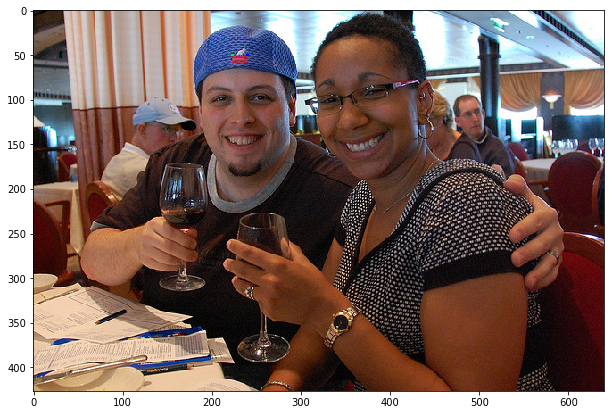

-------
{u'height': 640, u'width': 427, u'set': u'train', u'id': 231049, u'file_name': u'COCO_train2014_000000231049.jpg'}


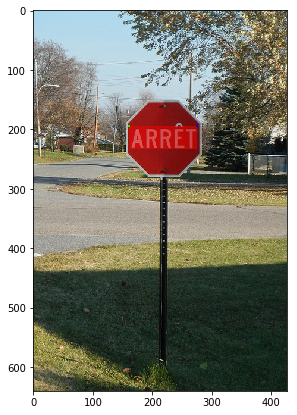

-------
{u'height': 640, u'width': 427, u'set': u'val', u'id': 346812, u'file_name': u'COCO_train2014_000000346812.jpg'}


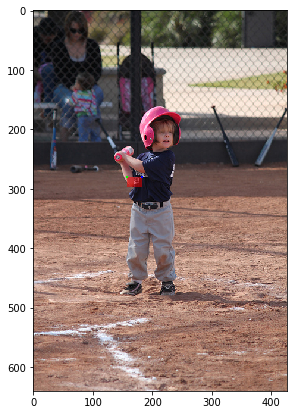

-------
{u'height': 480, u'width': 640, u'set': u'train', u'id': 326594, u'file_name': u'COCO_train2014_000000326594.jpg'}


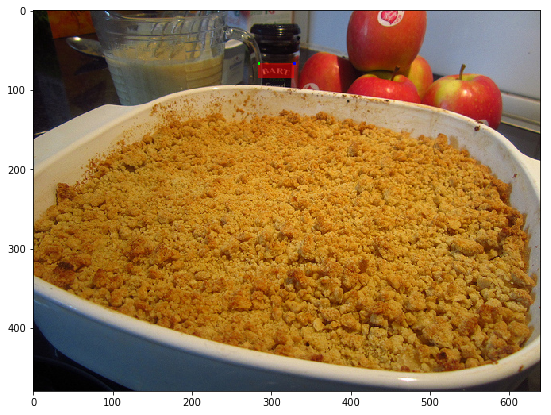

-------
{u'height': 480, u'width': 640, u'set': u'train', u'id': 561849, u'file_name': u'COCO_train2014_000000561849.jpg'}


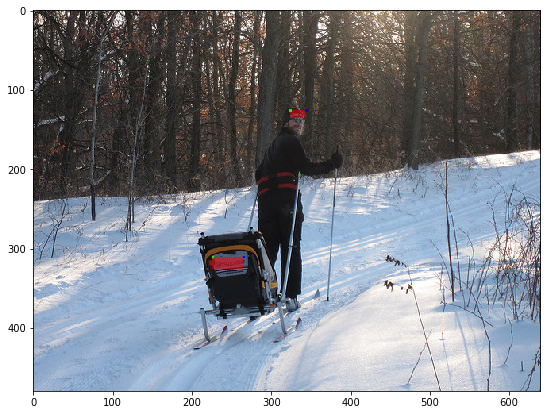

-------
{u'height': 383, u'width': 640, u'set': u'train', u'id': 124117, u'file_name': u'COCO_train2014_000000124117.jpg'}


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


-------
{u'height': 333, u'width': 500, u'set': u'train', u'id': 376843, u'file_name': u'COCO_train2014_000000376843.jpg'}


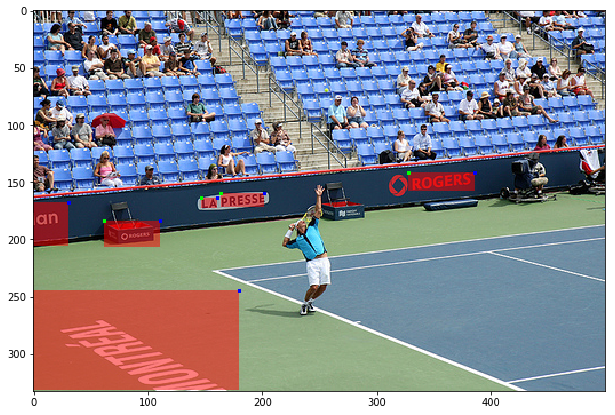

-------
{u'height': 500, u'width': 334, u'set': u'train', u'id': 140850, u'file_name': u'COCO_train2014_000000140850.jpg'}


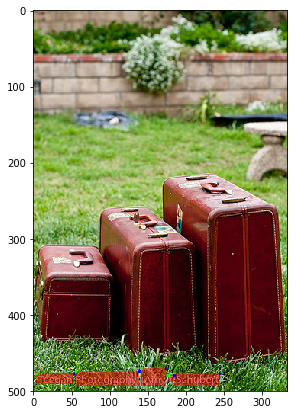

-------
{u'height': 425, u'width': 640, u'set': u'train', u'id': 378865, u'file_name': u'COCO_train2014_000000378865.jpg'}


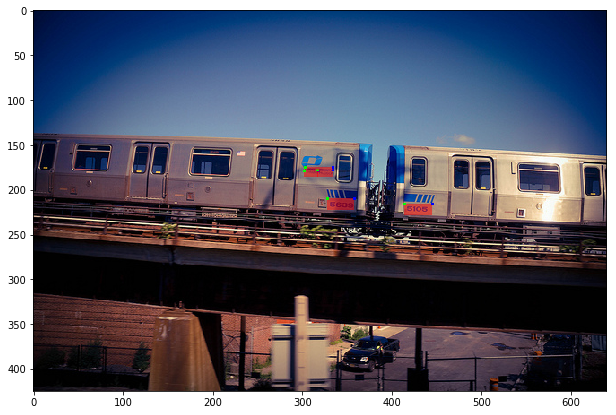

-------
{u'height': 491, u'width': 640, u'set': u'train', u'id': 376848, u'file_name': u'COCO_train2014_000000376848.jpg'}


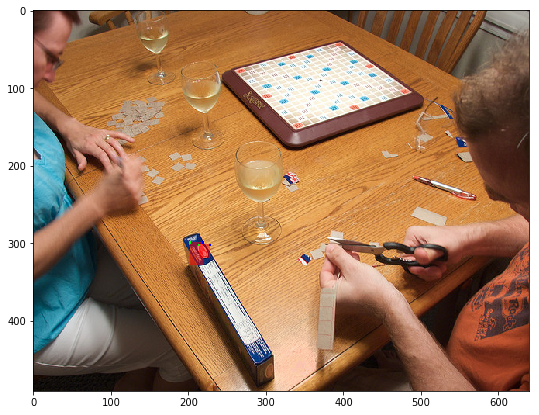

-------
{u'height': 633, u'width': 640, u'set': u'train', u'id': 32607, u'file_name': u'COCO_train2014_000000032607.jpg'}


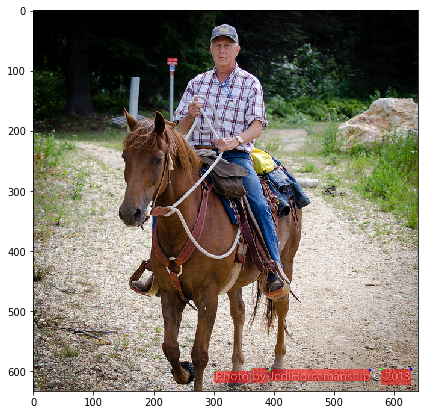

-------


In [31]:
imgs = anno['imgs']
imgToAnns = anno['imgToAnns']
anns = anno['anns']

for img in imgs.values()[600:620]:
    img_id = img['id']
    anns_for_img = imgToAnns[str(img_id)]
    if len(anns_for_img) <1:
        continue
    print img ###
    im = io.imread(os.path.join(image_root, img['file_name']))
    
    p_list = []
    for a in anns_for_img:
        ann = anns[str(a)]
        #print ann ###
        b = np.array(ann['bbox'], dtype=np.int32)
        p = np.array(ann['polygon'], dtype=np.int32)
        p_list.append(p)
    polygons = np.vstack(p_list)
    show_polygons(im, polygons)
    print '-------'

# ICDAR 2015 - challenge 4

In [33]:
gt_root = '/world/data-c7/censhusheng/data/icdar2015-ch4/train_gt/'
img_root = '/world/data-c7/censhusheng/data/icdar2015-ch4/train_images/'

/usr/lib/python2.7/site-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':
/usr/lib/python2.7/site-packages/ipykernel_launcher.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  # Remove the CWD from sys.path while we load stuff.


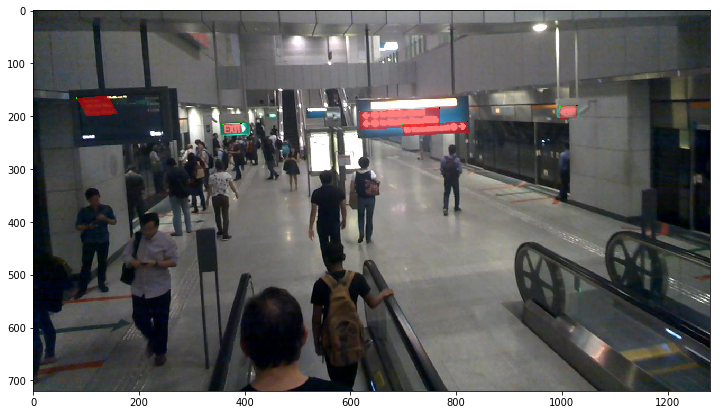

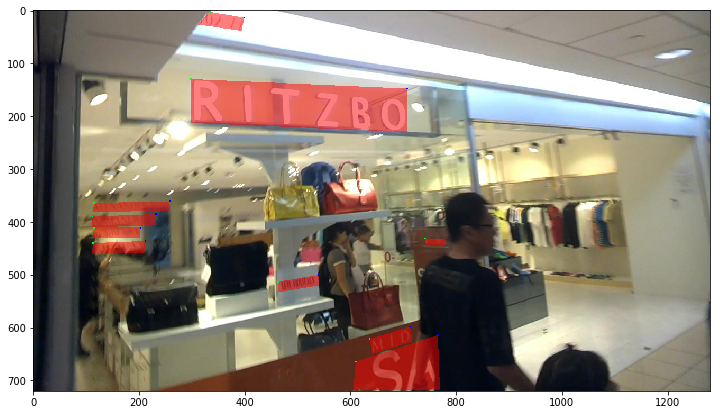

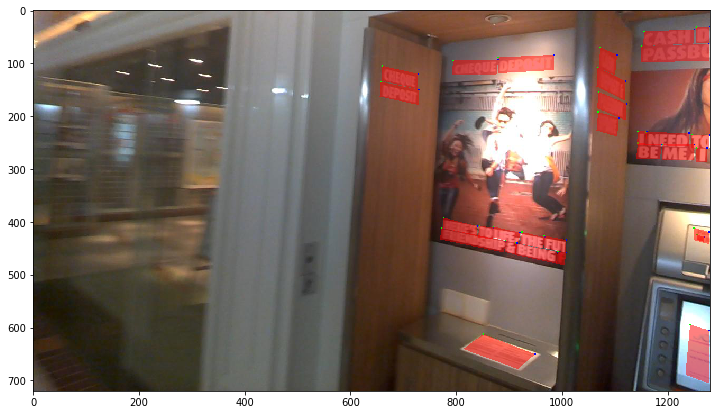

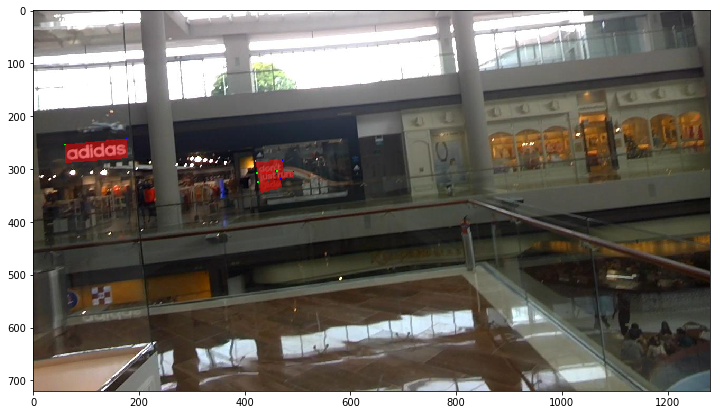

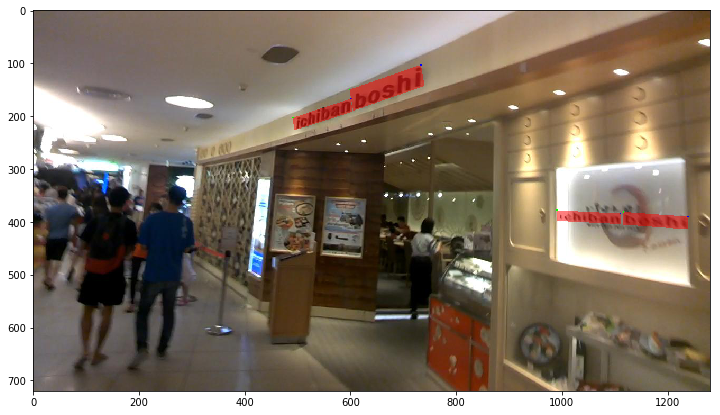

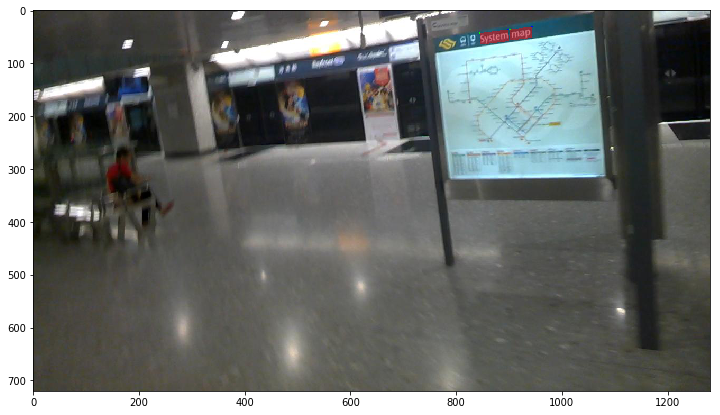

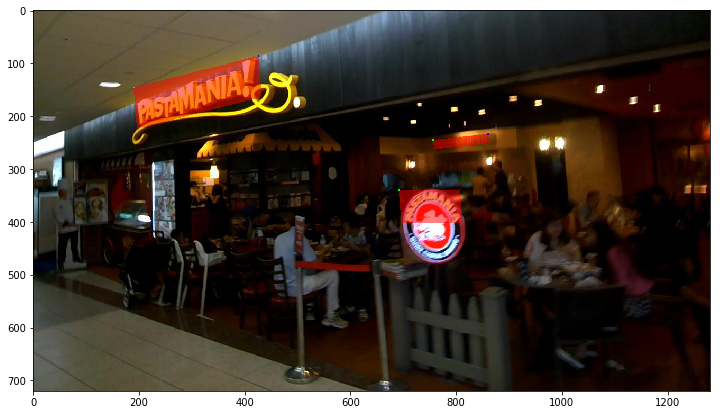

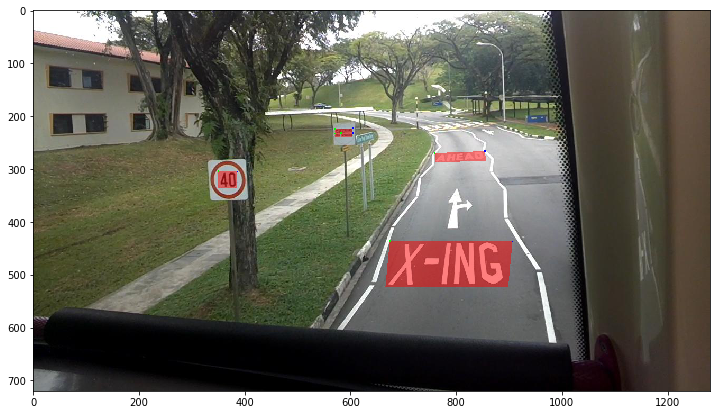

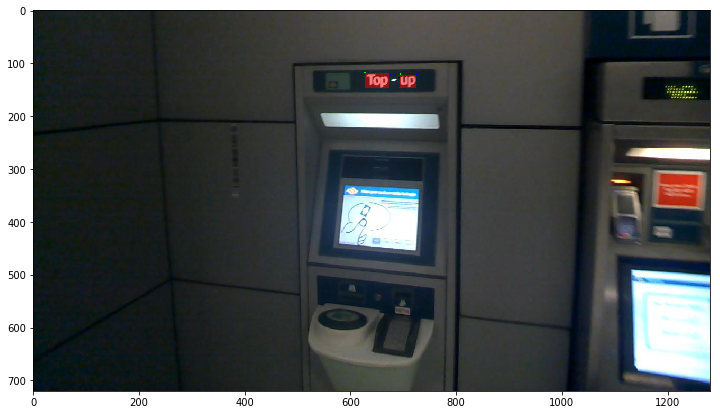

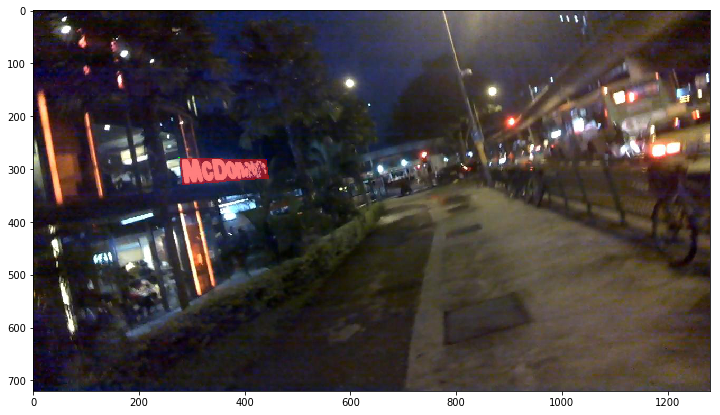

In [43]:
for fn in os.listdir(img_root)[:10]:
    gt_fn = 'gt_' + os.path.splitext(fn)[0] + '.txt'
    p_list = []
    with open(os.path.join(gt_root, gt_fn)) as f_gt:
        for line in f_gt.readlines():
            line = line.decode("utf-8-sig").encode("utf-8")
            items = line.strip().split(',')
            p = [int(x) for x in items[:8]]
            p_list.append(p)
            content = items[8]
    polygons = np.array(p_list, dtype=np.float32)
    im = io.imread(os.path.join(img_root, fn))
    show_polygons(im, polygons)

# MSRA-TD500

In [44]:
data_root = '/world/data-c7/censhusheng/data/MSRA-TD500/train'

In [72]:
import math
def rbox_2_polygon(x, y, w, h, deg):
    w2 = w*0.5
    h2 = h*0.5
    xc = x + w2
    yc = y + h2
    m_rot = np.array([[np.cos(deg), -np.sin(deg)], 
                      [np.sin(deg), np.cos(deg)]], dtype=np.float32)
    pts_ = np.array([[-w2,-h2],
                     [w2,-h2],
                     [w2,h2],
                     [-w2,h2]], dtype=np.float32)
    pts = np.dot(m_rot, pts_.T).T
    pts[:,0] = pts[:,0] + xc
    pts[:,1] = pts[:,1] + yc
    return pts.flatten().tolist()

/usr/lib/python2.7/site-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  # This is added back by InteractiveShellApp.init_path()
/usr/lib/python2.7/site-packages/ipykernel_launcher.py:12: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if sys.path[0] == '':


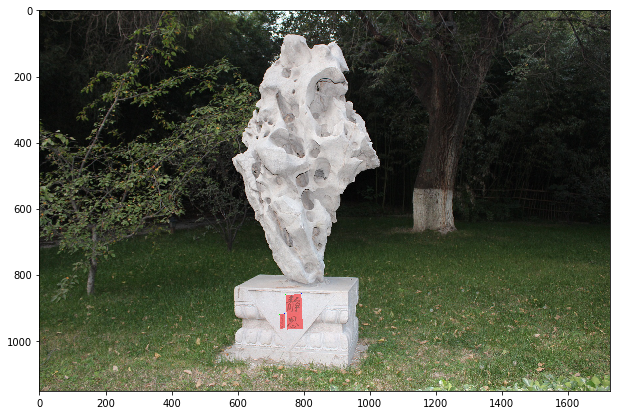

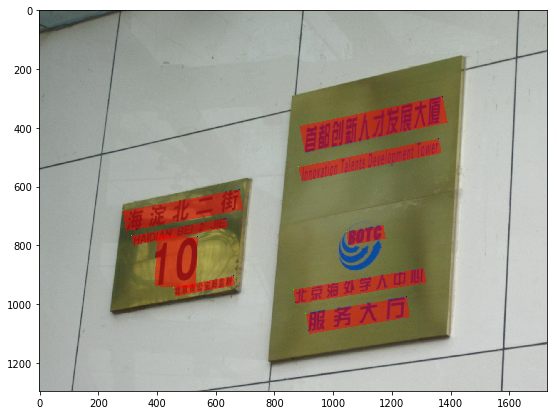

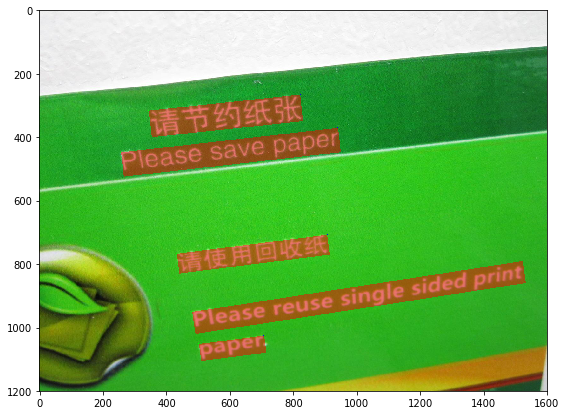

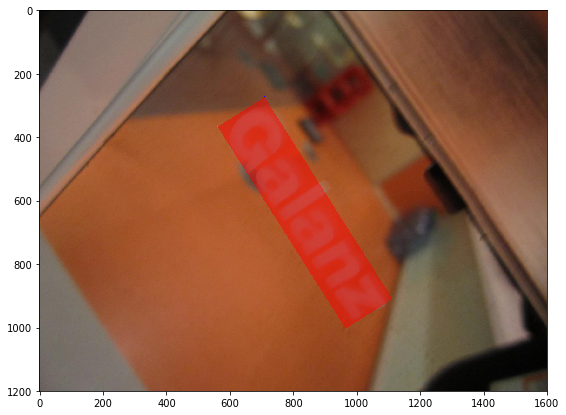

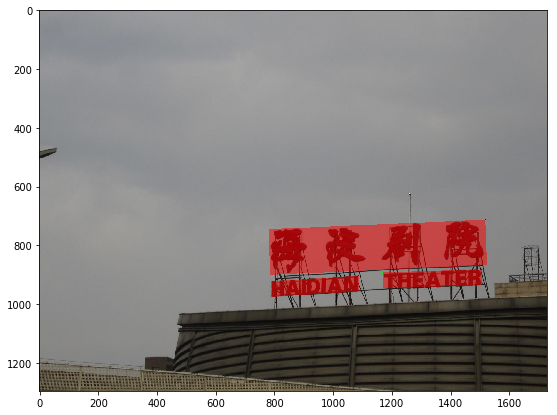

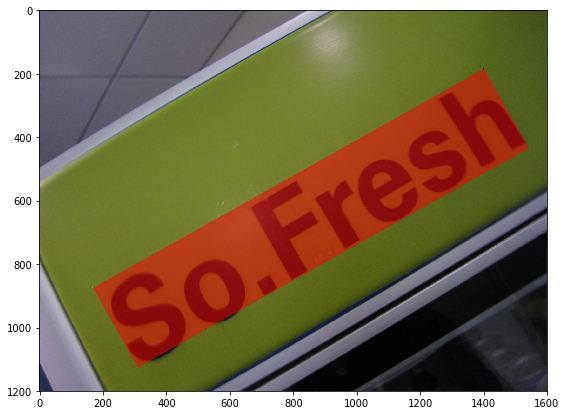

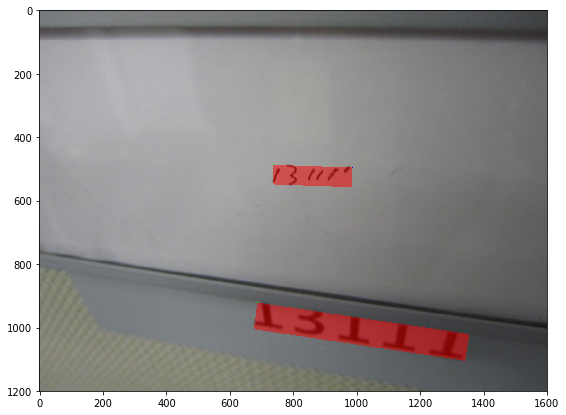

In [73]:
for fn in os.listdir(data_root)[:10]:
    if os.path.splitext(fn)[1] == '.gt':
        continue
    gt_fn = os.path.splitext(fn)[0] + '.gt'
    p_list = []
    with open(os.path.join(data_root, gt_fn)) as f_gt:
        for line in f_gt.readlines():
            #line = line.decode("utf-8-sig").encode("utf-8")
            items = line.strip().split()
            index = int(items[0])
            difficult = int(items[1])
            x = int(items[2])
            y = int(items[3])
            w = int(items[4])
            h = int(items[5])
            deg = float(items[6])
            p_list.append(rbox_2_polygon(x, y, w, h, deg))
    polygons = np.array(p_list, dtype=np.float32)
    im = io.imread(os.path.join(data_root, fn))
    show_polygons(im, polygons)    